<a href="https://colab.research.google.com/github/Khalid-Rafiq-01/Image-Segmentation-Pets-Datset/blob/main/Pretrained_Segmentation_Models_TF_Lib.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#The main purpose of the notebook is:
*Use various pretrained model available in model segentation library.*

*Compare the reults from these models*

*Pretrained models tried*
1. ResNet18
2. ResNet34
3. EfficientNetB0
4. EfficientNetB1
5. EfficientNetB2
6. EfficientNetB3
**All the Input images are reshaped to a size of (256,256,3).**

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = MinMaxScaler()

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

import tensorflow_datasets as tfds

In [ ]:
pip install -q tfds-nightly tensorflow matplotlib

In [ ]:
# Loading the dataset:
dataset, info = tfds.load('oxford_iiit_pet', with_info=True)
print(info.features)

FeaturesDict({
    'file_name': Text(shape=(), dtype=string),
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=37),
    'segmentation_mask': Image(shape=(None, None, 1), dtype=uint8),
    'species': ClassLabel(shape=(), dtype=int64, num_classes=2),
})


*# Let us resize all the images to a value of (256,256), which is not close to the central tendency of the entire dataset, but due to computational resources available is workable!*

In [ ]:
# Definfing a function that performs data normalization:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1 # Changes the pixel values of masks from (1,2,3) to (0,1,2)
  return input_image, input_mask

*The input datapoint is assumed to be a dictionary with two keys: 'image' and 'segmentation_mask'. These keys are used to extract the corresponding images from the datapoint dictionary.

In [ ]:
# Imp: reshaped to (256, 256) -- 
def load_image(datapoint):
  input_image = tf.image.resize(datapoint['image'], (256, 256))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (256, 256))

  input_image, input_mask = normalize(input_image, input_mask)

 
  return input_image, input_mask


In [ ]:
BUFFER_SIZE = 1000

In [ ]:
# Keeping a batch size = 16 due to low RAM space. 
train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE).shuffle(BUFFER_SIZE).batch(16)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)


In [ ]:
print(type(train_images))
print(len(train_images))

<class 'tensorflow.python.data.ops.batch_op._BatchDataset'>
230


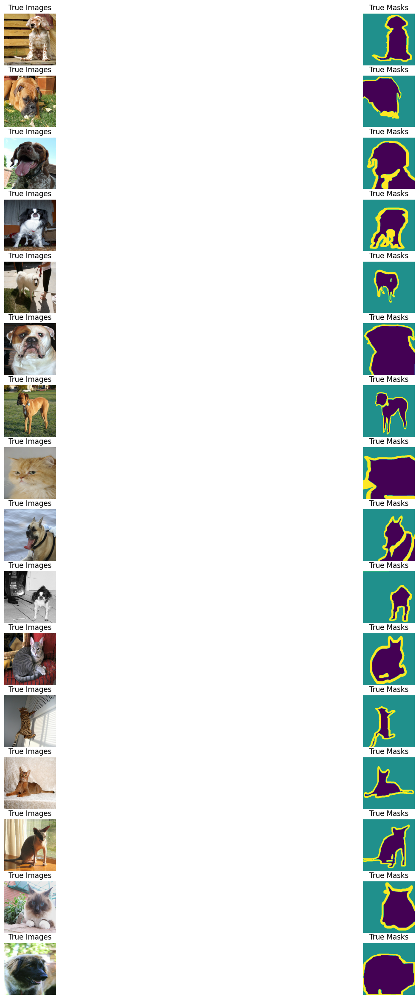

In [ ]:
for images, masks in train_images.take(1):
# Create a 2x16 grid of subplots
  fig, axes = plt.subplots(nrows=16, ncols=2, figsize=(20, 30))

  # Iterate over the first 2 images and masks
  for i in range(16):
    # Plot the image on the left side of the subplot
    axes[i, 0].imshow(images[i])
    axes[i, 0].axis('off')
    axes[i, 0].set_title('True Images')
    # Plot the mask on the right side of the subplot
    axes[i, 1].imshow(masks[i])
    axes[i, 1].axis('off')
    axes[i, 1].set_title('True Masks')

# Show the plot
plt.show()


In [ ]:
# importing the necessary libraries:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Conv2D, MaxPooling2D, Activation, Conv2DTranspose, Input, Dropout, BatchNormalization
from keras.models import Model

In [ ]:
classes = 3
image_height = 256
image_width = 256
channels = 3

#Importing the UNet pretrained models from the Segmentation Models-
**Primary Goal**

*Train the reshape dataset on pretrained models.*

*Compare the results of different pretrained models.*

In [ ]:
! pip install segmentation_models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
### Defining different backbones:
 
backbone_resnet18 = 'resnet18'
backbone_resnet34 = 'resnet34'



backbone_efficientnetb0 = 'efficientnetb0'
backbone_efficientnetb1 = 'efficientnetb1'
backbone_efficientnetb2 = 'efficientnetb2'
backbone_efficientnetb3 = 'efficientnetb3'


In [ ]:
# We will keep the parameters of the pretrained model learnable and reduce the learning rate to 1/10 of the default!
from keras.optimizers import Adam

In [ ]:
# Define models
model_resnet18 = sm.Unet(backbone_resnet18, encoder_weights='imagenet', classes=classes, activation='softmax')
model_resnet34 = sm.Unet(backbone_resnet34, encoder_weights='imagenet', classes=classes, activation='softmax')
model_efficientnetb0 = sm.Unet(backbone_efficientnetb0, encoder_weights='imagenet', classes=classes, activation='softmax')
model_efficientnetb1 = sm.Unet(backbone_efficientnetb1, encoder_weights='imagenet', classes=classes, activation='softmax')
model_efficientnetb2 = sm.Unet(backbone_efficientnetb2, encoder_weights='imagenet', classes=classes, activation='softmax')
model_efficientnetb3 = sm.Unet(backbone_efficientnetb3, encoder_weights='imagenet', classes=classes, activation='softmax')


# Compile all the models
model_resnet18.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_resnet34.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_efficientnetb0.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_efficientnetb1.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_efficientnetb2.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_efficientnetb3.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])


258434480/258434480 [==============================] - 4s 0us/step


In [ ]:
# Defining model callbacks:
from keras.callbacks import ModelCheckpoint

filepath_resnet18= "reshape_resnet18.h5"
callbacks_list_resnet18 = [ModelCheckpoint(filepath_resnet18, save_best_only=True)]

filepath_resnet34= "reshape_resnet34.h5"
callbacks_list_resnet34 = [ModelCheckpoint(filepath_resnet34, save_best_only=True)]

filepath_efficientnetb0= "reshape_efficientnetb0.h5"
callbacks_list_efficientnetb0 = [ModelCheckpoint(filepath_efficientnetb0, save_best_only=True)]

filepath_efficientnetb1= "reshape_efficientnetb1.h5"
callbacks_list_efficientnetb1 = [ModelCheckpoint(filepath_efficientnetb1, save_best_only=True)]

filepath_efficientnetb2= "reshape_efficientnetb2.h5"
callbacks_list_efficientnetb2 = [ModelCheckpoint(filepath_efficientnetb2, save_best_only=True)]

filepath_efficientnetb3= "reshape_efficientnetb3.h5"
callbacks_list_efficientnetb3 = [ModelCheckpoint(filepath_efficientnetb3, save_best_only=True)]



#Fitting all the models one-by-one!

**Working on ResNet18**

In [ ]:
history_resnet18 = model_resnet18.fit(train_images,
        validation_data=test_images,
        epochs=20,
        batch_size = 16,
        callbacks=callbacks_list_resnet18
    )

Epoch 1/20
230/230 [==============================] - 89s 277ms/step - loss: 0.4749 - accuracy: 0.8206 - val_loss: 1.5578 - val_accuracy: 0.5731
Epoch 2/20
230/230 [==============================] - 74s 301ms/step - loss: 0.2432 - accuracy: 0.9067 - val_loss: 1.3164 - val_accuracy: 0.6179
Epoch 3/20
230/230 [==============================] - 68s 280ms/step - loss: 0.1966 - accuracy: 0.9197 - val_loss: 0.4243 - val_accuracy: 0.8356
Epoch 4/20
230/230 [==============================] - 67s 280ms/step - loss: 0.1730 - accuracy: 0.9266 - val_loss: 0.2507 - val_accuracy: 0.9010
Epoch 5/20
230/230 [==============================] - 72s 300ms/step - loss: 0.1574 - accuracy: 0.9316 - val_loss: 0.2220 - val_accuracy: 0.9116
Epoch 6/20
230/230 [==============================] - 72s 301ms/step - loss: 0.1456 - accuracy: 0.9355 - val_loss: 0.2105 - val_accuracy: 0.9172
Epoch 7/20
230/230 [==============================] - 71s 297ms/step - loss: 0.1347 - accuracy: 0.9393 - val_loss: 0.2158 - val_ac

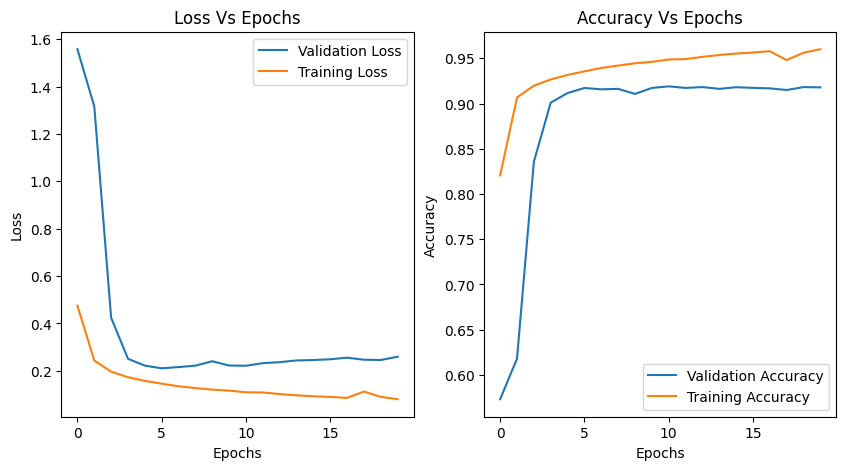

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_resnet18.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

*Loading the model*

In [ ]:
from keras.models import load_model
model_path_resnet18 = '/content/reshape_resnet18.h5'
trained_model_resnet18 = load_model(model_path_resnet18)

**Visualizing the model predictions on the test images**

In [ ]:
# Sub test_image folder:
test_image_list = []
test_masks_list = []
test_img_subfolder = []
test_mask_subfolder = []

for images, masks in test_images.take(20):
  # images = np.expand_dims(images, axis = 1)
  # masks = np.expand_dims(masks, axis = 1)
  test_image_list.append(images)
  test_masks_list.append(masks)

for i in range(len(test_image_list)):
  for j in range(len(test_image_list[0])):
    test_img_subfolder.append(test_image_list[i][j])
    test_mask_subfolder.append(test_masks_list[i][j])
test_img_subfolder = np.array(test_img_subfolder)
test_mask_subfolder = np.array(test_mask_subfolder)

In [ ]:
predicted_masks_resnet_18 = trained_model_resnet18.predict(test_img_subfolder, verbose = 0)

In [ ]:
pred_masks_resnet_18 = np.argmax(predicted_masks_resnet_18, axis = 3)

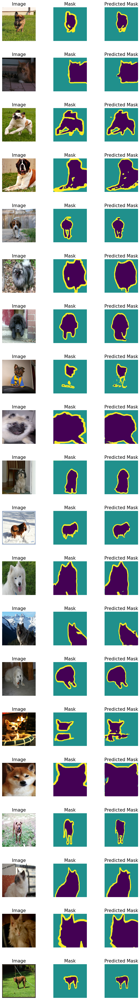

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_resnet_18[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**ResNet18 Model accuracy on the test images**

In [ ]:
score_resnet18 = trained_model_resnet18.evaluate(test_images)
print(f'The ResNet18 model accuracy on the test images is: {score_resnet18[1]}')

230/230 [==============================] - 25s 107ms/step - loss: 0.2105 - accuracy: 0.9172
The ResNet18 model accuracy on the test images is: 0.9171686172485352


**Working on ResNet34**

In [ ]:
history_resnet34 = model_resnet34.fit(train_images,
        validation_data=test_images,
        epochs=20,
        batch_size = 16,
        callbacks=callbacks_list_resnet34
    )

Epoch 1/20
230/230 [==============================] - 90s 334ms/step - loss: 0.4063 - accuracy: 0.8479 - val_loss: 1.8423 - val_accuracy: 0.5732
Epoch 2/20
230/230 [==============================] - 84s 348ms/step - loss: 0.2172 - accuracy: 0.9140 - val_loss: 0.8380 - val_accuracy: 0.7349
Epoch 3/20
230/230 [==============================] - 81s 330ms/step - loss: 0.1822 - accuracy: 0.9238 - val_loss: 0.3106 - val_accuracy: 0.8767
Epoch 4/20
230/230 [==============================] - 81s 335ms/step - loss: 0.1577 - accuracy: 0.9319 - val_loss: 0.2164 - val_accuracy: 0.9140
Epoch 5/20
230/230 [==============================] - 81s 340ms/step - loss: 0.1422 - accuracy: 0.9368 - val_loss: 0.2058 - val_accuracy: 0.9189
Epoch 6/20
230/230 [==============================] - 84s 354ms/step - loss: 0.1359 - accuracy: 0.9388 - val_loss: 0.1991 - val_accuracy: 0.9213
Epoch 7/20
230/230 [==============================] - 78s 325ms/step - loss: 0.1269 - accuracy: 0.9422 - val_loss: 0.1993 - val_ac

*Loading the model*

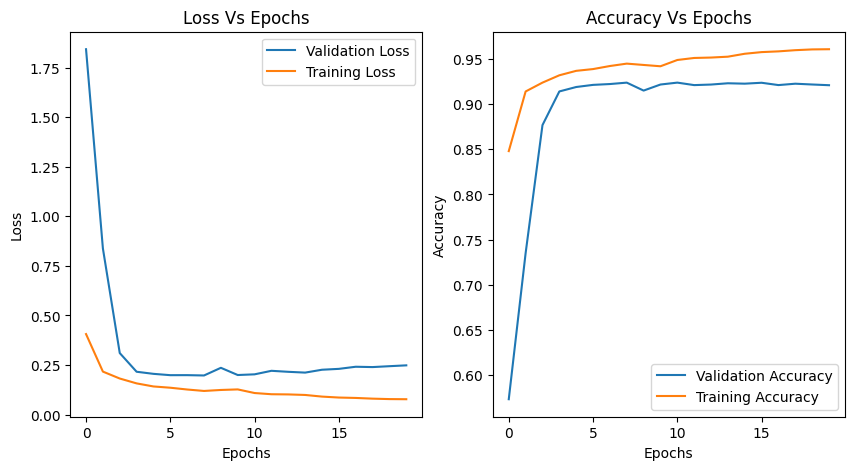

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_resnet34.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

In [ ]:
from keras.models import load_model
model_path_resnet34 = '/content/reshape_resnet34.h5'
trained_model_resnet34 = load_model(model_path_resnet34)

In [ ]:
predicted_masks_resnet_34 = trained_model_resnet34.predict(test_img_subfolder, verbose = 0)
pred_masks_resnet_34 = np.argmax(predicted_masks_resnet_34, axis = 3)

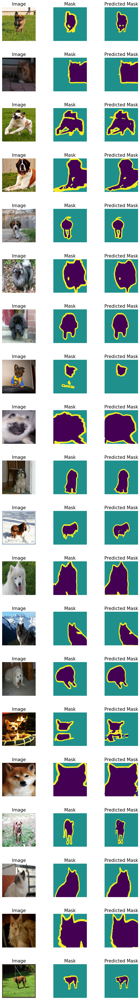

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_resnet_34[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**ResNet34 Model accuracy on the test images**

In [ ]:
score_resnet34 = trained_model_resnet34.evaluate(test_images)
print(f'The ResNet34 model accuracy on the test images is: {score_resnet34[1]}')

230/230 [==============================] - 20s 82ms/step - loss: 0.1976 - accuracy: 0.9238
The ResNet34 model accuracy on the test images is: 0.9237798452377319


**Working on EfficientNetB0**

*We are changing the number of epochs to 15*

In [ ]:
history_efficientnetb0 = model_efficientnetb0.fit(train_images,
        validation_data=test_images,
        epochs=15,
        batch_size = 16,  #Changing to 4 since the model is converging too soon
        callbacks=callbacks_list_efficientnetb0
    )

Epoch 1/15
230/230 [==============================] - 139s 524ms/step - loss: 0.4562 - accuracy: 0.8285 - val_loss: 0.2962 - val_accuracy: 0.9111
Epoch 2/15
230/230 [==============================] - 99s 416ms/step - loss: 0.2247 - accuracy: 0.9145 - val_loss: 0.2038 - val_accuracy: 0.9213
Epoch 3/15
230/230 [==============================] - 100s 420ms/step - loss: 0.1901 - accuracy: 0.9228 - val_loss: 0.1962 - val_accuracy: 0.9210
Epoch 4/15
230/230 [==============================] - 99s 416ms/step - loss: 0.1721 - accuracy: 0.9274 - val_loss: 0.1943 - val_accuracy: 0.9200
Epoch 5/15
230/230 [==============================] - 98s 412ms/step - loss: 0.1616 - accuracy: 0.9308 - val_loss: 0.1964 - val_accuracy: 0.9198
Epoch 6/15
230/230 [==============================] - 102s 432ms/step - loss: 0.1498 - accuracy: 0.9342 - val_loss: 0.1916 - val_accuracy: 0.9228
Epoch 7/15
230/230 [==============================] - 100s 421ms/step - loss: 0.1411 - accuracy: 0.9371 - val_loss: 0.1906 - va

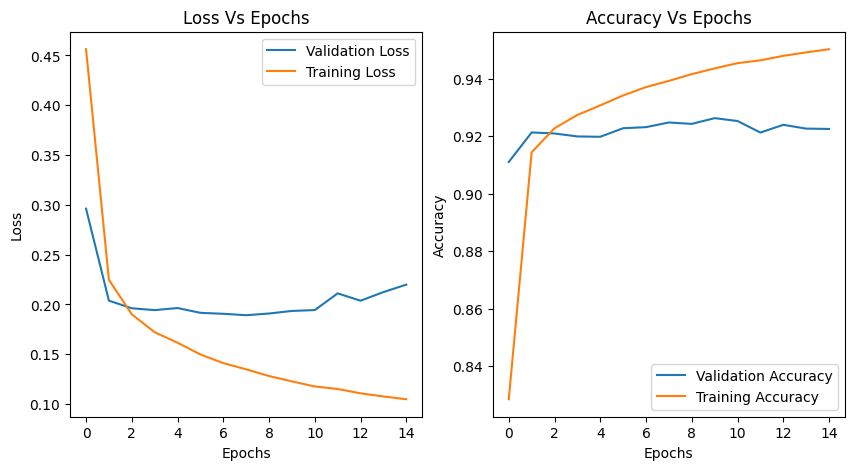

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_efficientnetb0.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

In [ ]:
from keras.models import load_model
model_path_b0 = '/content/reshape_efficientnetb0.h5'
trained_model_b0 = load_model(model_path_b0)

In [ ]:
predicted_masks_b0 = trained_model_b0.predict(test_img_subfolder, verbose = 0)
pred_masks_b0 = np.argmax(predicted_masks_b0, axis = 3)

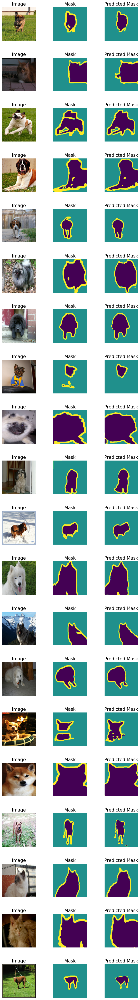

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_b0[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**EfficientNetB0 Model accuracy on the test images**

In [ ]:
score_b0 = trained_model_b0.evaluate(test_images)
print(f'The EfficientNetB0 model accuracy on the test images is: {score_b0[1]}')

230/230 [==============================] - 20s 80ms/step - loss: 0.1892 - accuracy: 0.9248
The EfficientNetB0 model accuracy on the test images is: 0.9248191714286804


**Working on EfficientNetB1**

In [ ]:
history_efficientnetb1 = model_efficientnetb1.fit(train_images,
        validation_data=test_images,
        epochs=15,
        batch_size = 16,  #Changing to 16 since the model is converging too soon
        callbacks=callbacks_list_efficientnetb1
    )

Epoch 1/15
230/230 [==============================] - 134s 502ms/step - loss: 0.3881 - accuracy: 0.8498 - val_loss: 0.2526 - val_accuracy: 0.9114
Epoch 2/15
230/230 [==============================] - 116s 490ms/step - loss: 0.2051 - accuracy: 0.9175 - val_loss: 0.1969 - val_accuracy: 0.9209
Epoch 3/15
230/230 [==============================] - 119s 499ms/step - loss: 0.1774 - accuracy: 0.9253 - val_loss: 0.1860 - val_accuracy: 0.9246
Epoch 4/15
230/230 [==============================] - 115s 486ms/step - loss: 0.1620 - accuracy: 0.9299 - val_loss: 0.1884 - val_accuracy: 0.9231
Epoch 5/15
230/230 [==============================] - 115s 486ms/step - loss: 0.1519 - accuracy: 0.9331 - val_loss: 0.2129 - val_accuracy: 0.9165
Epoch 6/15
230/230 [==============================] - 116s 492ms/step - loss: 0.1460 - accuracy: 0.9350 - val_loss: 0.1816 - val_accuracy: 0.9266
Epoch 7/15
230/230 [==============================] - 117s 494ms/step - loss: 0.1382 - accuracy: 0.9376 - val_loss: 0.1762 -

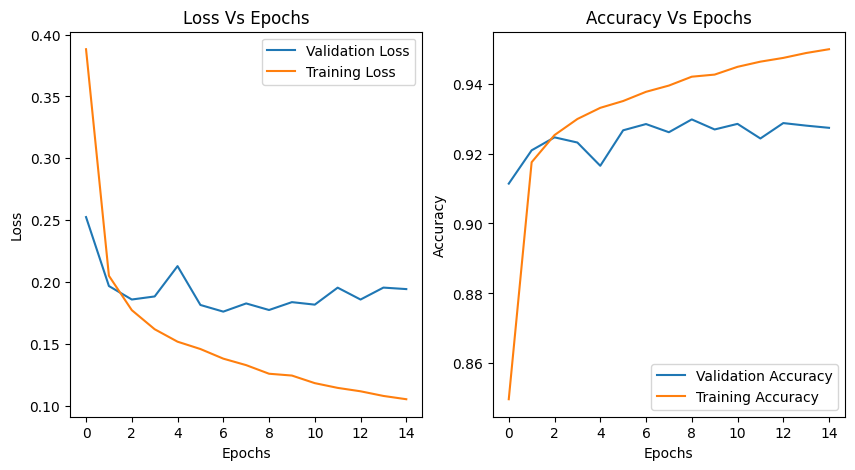

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_efficientnetb1.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

In [ ]:
from keras.models import load_model
model_path_b1 = '/content/reshape_efficientnetb1.h5'
trained_model_b1 = load_model(model_path_b1)

In [ ]:
predicted_masks_b1 = trained_model_b1.predict(test_img_subfolder, verbose = 0)
pred_masks_b1 = np.argmax(predicted_masks_b1, axis = 3)

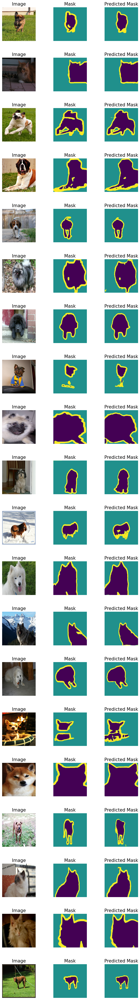

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_b1[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**EfficientNetB1 Model accuracy on the test images**

In [ ]:
score_b1 = trained_model_b1.evaluate(test_images)
print(f'The EfficientNetB1 model accuracy on the test images is: {score_b1[1]}')

230/230 [==============================] - 23s 90ms/step - loss: 0.1762 - accuracy: 0.9284
The EfficientNetB1 model accuracy on the test images is: 0.9284295439720154


**Working on EfficientNetB2**

In [ ]:
history_efficientnetb2 = model_efficientnetb2.fit(train_images,
        validation_data=test_images,
        epochs=15,
        batch_size = 16,  #Changing to 16 since the model is converging too soon
        callbacks=callbacks_list_efficientnetb2
    )

Epoch 1/15
230/230 [==============================] - 150s 520ms/step - loss: 0.4215 - accuracy: 0.8323 - val_loss: 0.2676 - val_accuracy: 0.9061
Epoch 2/15
230/230 [==============================] - 139s 591ms/step - loss: 0.2078 - accuracy: 0.9174 - val_loss: 0.2009 - val_accuracy: 0.9192
Epoch 3/15
230/230 [==============================] - 139s 591ms/step - loss: 0.1802 - accuracy: 0.9250 - val_loss: 0.1926 - val_accuracy: 0.9216
Epoch 4/15
230/230 [==============================] - 139s 590ms/step - loss: 0.1644 - accuracy: 0.9293 - val_loss: 0.1812 - val_accuracy: 0.9262
Epoch 5/15
230/230 [==============================] - 120s 502ms/step - loss: 0.1513 - accuracy: 0.9333 - val_loss: 0.1778 - val_accuracy: 0.9264
Epoch 6/15
230/230 [==============================] - 118s 500ms/step - loss: 0.1420 - accuracy: 0.9365 - val_loss: 0.1839 - val_accuracy: 0.9242
Epoch 7/15
230/230 [==============================] - 118s 501ms/step - loss: 0.1367 - accuracy: 0.9383 - val_loss: 0.1802 -

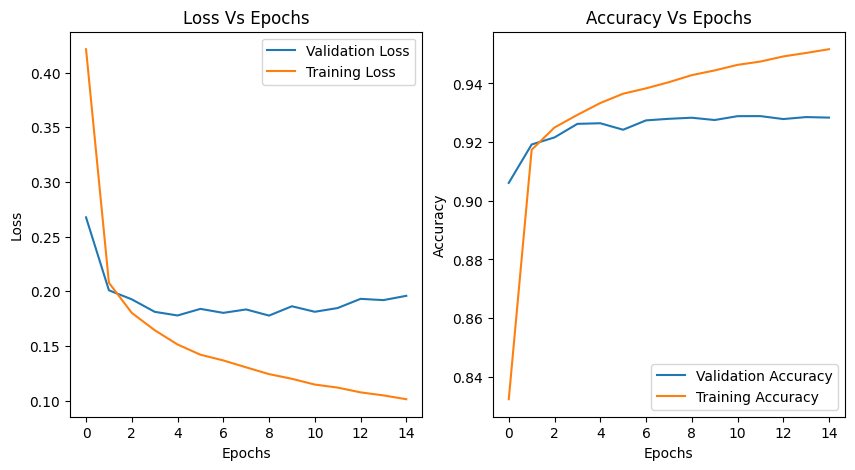

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_efficientnetb2.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

In [ ]:
from keras.models import load_model
model_path_b2 = '/content/reshape_efficientnetb2.h5'
trained_model_b2 = load_model(model_path_b2)

In [ ]:
predicted_masks_b2 = trained_model_b2.predict(test_img_subfolder, verbose = 0)
pred_masks_b2 = np.argmax(predicted_masks_b2, axis = 3)

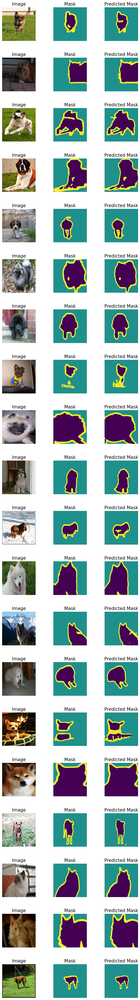

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_b2[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**EfficientNetB2 Model accuracy on the test images**

In [ ]:
score_b2 = trained_model_b2.evaluate(test_images)
print(f'The EfficientNetB2 model accuracy on the test images is: {score_b2[1]}')

230/230 [==============================] - 24s 93ms/step - loss: 0.1777 - accuracy: 0.9283
The EfficientNetB2 model accuracy on the test images is: 0.9283027052879333


**Working on EfficientNetB3**

In [ ]:
history_efficientnetb3 = model_efficientnetb3.fit(train_images,
        validation_data=test_images,
        epochs=15,
        batch_size = 16,  #Changing to 16 since the model is converging too soon
        callbacks=callbacks_list_efficientnetb3
    )

Epoch 1/15
230/230 [==============================] - 162s 611ms/step - loss: 0.5297 - accuracy: 0.7923 - val_loss: 0.3709 - val_accuracy: 0.9067
Epoch 2/15
230/230 [==============================] - 143s 609ms/step - loss: 0.2330 - accuracy: 0.9189 - val_loss: 0.2233 - val_accuracy: 0.9192
Epoch 3/15
230/230 [==============================] - 140s 597ms/step - loss: 0.1912 - accuracy: 0.9260 - val_loss: 0.2025 - val_accuracy: 0.9204
Epoch 4/15
230/230 [==============================] - 158s 674ms/step - loss: 0.1678 - accuracy: 0.9309 - val_loss: 0.1949 - val_accuracy: 0.9202
Epoch 5/15
230/230 [==============================] - 158s 675ms/step - loss: 0.1567 - accuracy: 0.9337 - val_loss: 0.1878 - val_accuracy: 0.9234
Epoch 6/15
230/230 [==============================] - 142s 598ms/step - loss: 0.1458 - accuracy: 0.9367 - val_loss: 0.1861 - val_accuracy: 0.9257
Epoch 7/15
230/230 [==============================] - 158s 676ms/step - loss: 0.1355 - accuracy: 0.9398 - val_loss: 0.1776 -

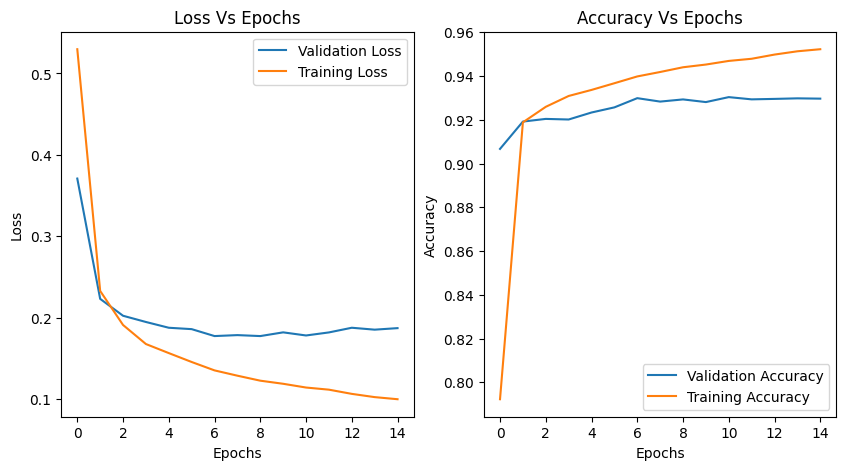

In [ ]:
# Plotting the Validation Loss N Validation Accuracy against the number of Epochs:
import pandas as pd
data = pd.DataFrame(history_efficientnetb3.history)
(a,b) = data.shape

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(a), data['val_loss'], label = "Validation Loss")
plt.plot(range(a), data['loss'], label = "Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Vs Epochs")
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(a), data['val_accuracy'], label = "Validation Accuracy")
plt.plot(range(a), data['accuracy'], label = "Training Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Vs Epochs")
plt.legend()

In [ ]:
from keras.models import load_model
model_path_b3 = '/content/reshape_efficientnetb3.h5'
trained_model_b3 = load_model(model_path_b3)

In [ ]:
predicted_masks_b3 = trained_model_b3.predict(test_img_subfolder, verbose = 0)
pred_masks_b3 = np.argmax(predicted_masks_b3, axis = 3)

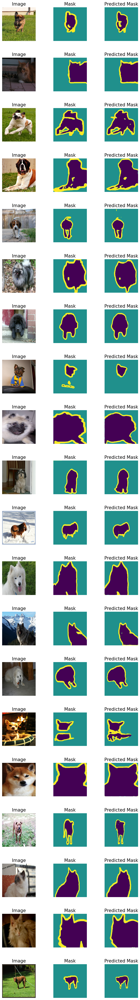

In [ ]:
# Define the size of each subplot image
subplot_size = (3, 3)
figsize = (subplot_size[0]*3, subplot_size[1]*20)

# Iterate over the first 20 images, True masks and predicted masks
fig, axes = plt.subplots(nrows=20, ncols=3, figsize=figsize)

for i in range(20):
    # Plot the image on the top row of the subplot
    axes[i, 0].imshow(test_img_subfolder[i])
    axes[i, 0].set_title('Image', fontsize=15)
    axes[i, 0].axis('off')

    # Plot the mask on the middle row of the subplot
    axes[i, 1].imshow(test_mask_subfolder[i])
    axes[i, 1].set_title('Mask', fontsize=15)
    axes[i, 1].axis('off')

    # Plot the predicted mask on the bottom row of the subplot
    axes[i, 2].imshow(pred_masks_b3[i])
    axes[i, 2].set_title('Predicted Mask', fontsize=15)
    axes[i, 2].axis('off')

# Adjust the size and spacing of the subplots
fig.subplots_adjust(hspace=0.5, wspace=0.1)


# Show the plot
plt.show()

**EfficientNetB3 Model accuracy on the test images**

In [ ]:
score_b3 = trained_model_b3.evaluate(test_images)
print(f'The EfficientNetB2 model accuracy on the test images is: {score_b3[1]}')

230/230 [==============================] - 27s 108ms/step - loss: 0.1776 - accuracy: 0.9293
The EfficientNetB2 model accuracy on the test images is: 0.9293358325958252


#Plotting the Accuracy vs number of Parameters

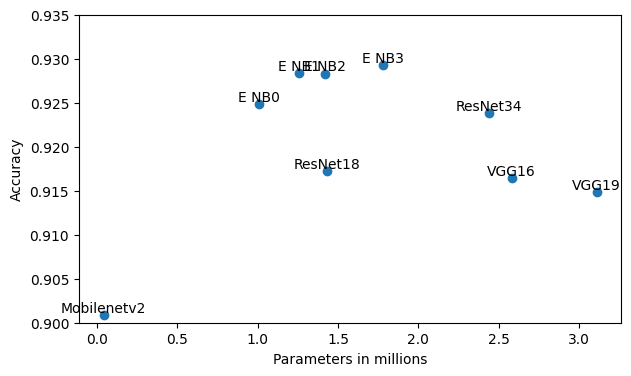

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize = (7,4))

params = [1.43, 2.44, 1.01, 1.26, 1.42, 1.78, 0.0416, 3.11, 2.58]
acc = [0.9172, 0.9238, 0.9248, 0.9284, 0.9283, 0.9293, 0.9009, 0.9148, 0.9164]

model_names = ['ResNet18', 'ResNet34', 'E NB0', 'E NB1', 'E NB2', 'E NB3', 'Mobilenetv2', 'VGG19' ,'VGG16']

plt.scatter(params, acc)
plt.xlabel('Parameters in millions')
plt.ylabel('Accuracy')
plt.ylim(0.90, 0.935)

for i in range(len(params)):
    plt.text(params[i], acc[i], model_names[i], ha='center', va='bottom')

plt.show()

